# **ENTRENO DE UN MODELO DE DETECCIÓN DE SEÑALES DE TRÁFICO UTILIZANDO UN MODELO DE DEEP LEARNING PRE-ENTRENADO Y HACIENDO TRANSFER LEARNING**


## **Instalar la API de detección de objetos de Tensorflow**


In [ ]:
# Se clona el repositorio oficial de Tensorflow
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4107, done.
remote: Counting objects: 100% (4107/4107), done.
remote: Compressing objects: 100% (3108/3108), done.
remote: Total 4107 (delta 1188), reused 2036 (delta 937), pack-reused 0
Receiving objects: 100% (4107/4107), 45.35 MiB | 14.88 MiB/s, done.
Resolving deltas: 100% (1188/1188), done.


In [ ]:
# Se compilan los archivos de Protocol Buffers (.proto) y se generan
# archivos de código Python, posteriormente se copia el archivo setup.py
# en la ruta actual (/models/research)
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .

Antes de instalar los paquetes Python del script setup.py, se debe modificar la

línea 21: 'tf-models-official>=2.5.1', por 'tf-models-official>=2.5.1, <2.15.0',

In [ ]:
# Se instalan los paquetes Python del archivo de configuración enterior (setup.py)
!pip install /content/models/research/

Processing ./models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 61.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 86.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 16.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... don

In [ ]:
# Se instala Tensorflow 2.13.1, versión más reciente encontrada que
# no da problemas de dependencias
!pip install tensorflow==2.13.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.7/479.7 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 34.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 21.3 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.12.1
    Uninstalling typing_extensions-4.12.1:
      Successfully uninstalled typing_extensions-4.12.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
  Attempting uninstall: keras
    F

In [ ]:
# Se instala la version de CUDA 11, compatible con la version de Tensorflow instalada,
# de esta manera se puede usar el framework Tensorflow con GPU
!pip install tensorflow_io==0.23.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 87.7 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.37.0
    Uninstalling tensorflow-io-gcs-filesystem-0.37.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.37.0
  Attempting uninstall: tensorflow_io
    Found existing installation: tensorflow-io 0.37.0
    Uninstalling tensorflow-io-0.37.0:
      Successfully uninstalled tensorflow-io-0.37.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.14.0 requires tensorflow<2.15,>=2.14.0; platform_machine != "arm64" or platform_system != "Darwin", but you have tensorflow 2.13.1 which is incompatible.
tf-models-official 2.14.2 requires tensorflow~=2.14.0, but you have

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.13.1


In [ ]:
# Test para verificar que la API de detección de objetos de Tensorflow funciona correctamente
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2024-06-12 07:34:03.896119: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2024-06-12 07:34:09.757825: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0612 07:34:09.793827 138853548687360 batch_normalization.py:1531] `tf.keras.layers.experimental.SyncBatchNormalization` endpoint is deprecated and will be removed in a future release. Please use `tf.keras.layers.BatchNormalization` with parameter `synchronized` set to True.
W0612 07:34:10.224354 138853548687360 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 2.93s
I0612 07:34:10.598137 138853548687360 test_uti

## **Preparar el conjunto de datos**

Se tiene que comprimir la carpeta dataset de la siguiente manera:

    dataset.zip
    |__ dataset
        |__ test
        |__ train
        |__ validation
        |__ frame01.jpg
        |__ frame01.xml
        |__ frame02.jpg
        |__ frame02.xml
        .
        .
        .

Las imágenes deben ser de 320x320, ya que la capa de entrada del modelo es de este tamaño.

Las anotaciones se pueden realizar mediante LabelImage, que requiere una instalación o en la aplicación web [Make Sense](https://www.makesense.ai/). En este caso se ha optado por la segunda alternativa.

In [ ]:
# Se monta Drive y se copia el dataset en la carpeta del entorno de Colab
from google.colab import drive
drive.mount('/content/drive')

!cp /content/drive/MyDrive/tfg/dataset.zip /content

Mounted at /content/drive


In [ ]:
# Se descomprime el dataset
!unzip -q dataset.zip -d /content

In [ ]:
# Se definen los paths del dataset
dataset_path = '/content/dataset/'
train_path = '/content/dataset/train/'
test_path = '/content/dataset/test/'
validation_path = '/content/dataset/validation/'

In [ ]:
# Este código mueve de manera aleatoria (shufle) las imagenes .jpg y sus
# correspondientes anotaciones .xml a las carpetas de train, test, validation
import os
import shutil
import random

images_paths = [os.path.join(dataset_path, filename) for filename in os.listdir(dataset_path) if filename.lower().endswith('.jpg')]

total = len(images_paths)

train = int(total * 0.8)
validation = int(total * 0.15)
test = total - train - validation

for i in range(train):
    image_path = random.choice(images_paths)
    xml_path = image_path[:-4] + '.xml'
    shutil.move(image_path, train_path)
    shutil.move(xml_path, train_path)
    images_paths.remove(image_path)

for i in range(test):
    image_path = random.choice(images_paths)
    xml_path = image_path[:-4] + '.xml'
    shutil.move(image_path, test_path)
    shutil.move(xml_path, test_path)
    images_paths.remove(image_path)

for i in range(validation):
    image_path = random.choice(images_paths)
    xml_path = image_path[:-4] + '.xml'
    shutil.move(image_path, validation_path)
    shutil.move(xml_path, validation_path)
    images_paths.remove(image_path)

In [ ]:
# Función que parsea los ficheros de anotaciones para devolver un DataFrame de
# la librería Pandas con los datos importantes para el entrenamiento
import glob
import pandas as pd
import xml.etree.ElementTree as ET

def parse_xml(anotations_path):
    anotations_list = []
    for anotation_file in glob.glob(anotations_path + '/*.xml'):
        tree = ET.parse(anotation_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            anotations_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    anotations_dataframe = pd.DataFrame(anotations_list, columns=column_name)
    return anotations_dataframe

In [ ]:
# Se llama a la función anterior y se crean los dos CSV, el de train y el de validation
train_anotations_dataframe = parse_xml(train_path)
train_anotations_dataframe.to_csv(dataset_path+'train_labels.csv', index=None)

validation_anotations_dataframe = parse_xml(validation_path)
validation_anotations_dataframe.to_csv(dataset_path+'validation_labels.csv', index=None)

In [ ]:
# Se muestran las primeras filas del CSV
train_anotations_dataframe.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,frame077.jpg,320,320,60,10,88,37,128
1,frame077.jpg,320,320,luces,75,57,158,170
2,frame077.jpg,320,320,recto,183,62,235,131
3,frame100.jpg,320,320,luces,8,189,51,246
4,frame100.jpg,320,320,stop,106,95,160,173


In [ ]:
# Se muestran las primeras filas del CSV
validation_anotations_dataframe.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,frame122.jpg,320,320,der,143,126,209,209
1,frame122.jpg,320,320,stop,29,101,59,143
2,frame111.jpg,320,320,ceda,49,111,146,228
3,frame111.jpg,320,320,obras,163,82,229,163
4,frame111.jpg,320,320,rojo,143,84,155,125


In [ ]:
### This creates a a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF >> /content/labelmap.txt
stop
30
60
ceda
luces
obras
recto
izq
der
verde
rojo
EOF

In [ ]:
# Se definen las rutas a los CSV creados anteriormente y las rutas de los TFRecords
# que se crearán a continuación
train_csv_path = '/content/dataset/train_labels.csv'
validation_csv_path = '/content/dataset/validation_labels.csv'
labelmap_path = '/content/labelmap.txt'
train_tfrecord_path = '/content/train.tfrecord'
validation_tfrecord_path = '/content/val.tfrecord'

In [ ]:
# Lista que contiene las 11 etiquetas de clase del modelo a entrenar
labels = ['stop', '30', '60', 'ceda', 'luces', 'obras', 'recto', 'izq', 'der', 'verde', 'rojo']

In [ ]:
# Código que crea los TFRecord files, que contienen las imágenes codificadas en bytes
# y todas las anotaciones, de esta forma se cargan todos los datos de entrenamiento
# de forma eficiente
#import os
import io
#import pandas as pd
import tensorflow.compat.v1 as tf
from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict

def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    '''labels = []
    with open(labelmap_path, 'r') as f:
        labels = [line.strip() for line in f.readlines()]'''

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(int(labels.index(row['class'])+1))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

In [ ]:
# Se crea y escribe el train TFrecord
writer = tf.python_io.TFRecordWriter(train_tfrecord_path)
examples = pd.read_csv(train_csv_path)

grouped = split(examples, 'filename')
for group in grouped:
    tf_example = create_tf_example(group, train_path)
    writer.write(tf_example.SerializeToString())

writer.close()

In [ ]:
# Se crea y escribe el validation TFrecord
writer = tf.python_io.TFRecordWriter(validation_tfrecord_path)
examples = pd.read_csv(validation_csv_path)

grouped = split(examples, 'filename')
for group in grouped:
    tf_example = create_tf_example(group, validation_path)
    writer.write(tf_example.SerializeToString())

writer.close()

In [ ]:
# Se crea el archivo labelmap.pbtxt, un archivo que contiene la etiquetas de las
# clases estructuradas en un formato concreto. Este archivo se pasará posteriormente
# al pipeline de entrenamiento especifcándose en el archivo de configuracion del mismo.
'''with open(labelmap_path, 'r') as f:
    labels = [line.strip() for line in f.readlines()]'''
labelmap_pbtxt_path = '/content/labelmap.pbtxt'

with open(labelmap_pbtxt_path,'w') as f:
    for i, label in enumerate(labels):
        f.write('item {\n' +
                '  id: %d\n' % (i + 1) +
                '  name: \'%s\'\n' % label +
                '}\n' +
                '\n')

## **Descarga del modelo, configuración del pipeline de entranamiento y entreno**

In [ ]:
model_name = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8'
config_file = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
checkpoint_file = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz'

In [ ]:
# Se crea el directorio donde se guardará el modelo entrenado
%mkdir /content/models/traffic_signs_detection/
%cd /content/models/traffic_signs_detection/

# Se descarga el archivo de configuracion del pipeline de entrenamiento del modelo preentrenado
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config

# Se descarga el modelo preentrenado ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8 y se extrae
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

import tarfile
model = tarfile.open(checkpoint_file)
model.extractall()
model.close()

/content/models/traffic_signs_detection
--2024-06-12 07:43:24--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4684 (4.6K) [text/plain]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config’

ssd_mobilenet_v2_fp 100%[===================>]   4.57K  --.-KB/s    in 0s      

2024-06-12 07:43:24 (59.4 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config’ saved [4684/4684]

--2024-06-12 07:43:24--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.174.207

In [ ]:
# Se definen el número de pasos totales de entrenamiento y el tamaño de batch
steps = 40000 # se puede parar el entrenamiento antes, si se percibe que las métricas de pérdida se estabilizan
batch_size = 12

In [ ]:
config_path = '/content/models/traffic_signs_detection/' + config_file
checkpoint_path = '/content/models/traffic_signs_detection/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(labelmap_pbtxt_path)
print('Total classes:', num_classes)

Total classes: 11


In [ ]:
import re

%cd /content/models/traffic_signs_detection

with open(config_file) as f:
    s = f.read()
with open('traffic_signs_detection.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(checkpoint_path), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_tfrecord_path), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(validation_tfrecord_path), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(labelmap_pbtxt_path), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)


    f.write(s)


/content/models/traffic_signs_detection


In [ ]:
!cat {labelmap_pbtxt_path}

item {
  id: 1
  name: 'stop'
}

item {
  id: 2
  name: '30'
}

item {
  id: 3
  name: '60'
}

item {
  id: 4
  name: 'ceda'
}

item {
  id: 5
  name: 'luces'
}

item {
  id: 6
  name: 'obras'
}

item {
  id: 7
  name: 'recto'
}

item {
  id: 8
  name: 'izq'
}

item {
  id: 9
  name: 'der'
}

item {
  id: 10
  name: 'verde'
}

item {
  id: 11
  name: 'rojo'
}



A continuación se tiene que modificar el archivo de configuracion del pipeline de entranamiento, que se encuentra en la carpeta /content/models/traffic_signs_detections.

Modificando parámetros como el learning_rate, warmup_learning_rate, cambiar el tipo de tarea (de clasificación a detección), el número de pasos, el número de clases, el tamaño del batch, la ruta del labelmap.pbtxt, las rutas del TFRecord de entrenamiento y de validación, la configuración de el aumentado de datos, etc.

In [ ]:
!cat /content/models/traffic_signs_detection/traffic_signs_detection.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 11
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator 

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
custom_config_path = '/content/models/traffic_signs_detection/traffic_signs_detection.config'
model_training_path = '/content/training/'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!cp /content/labelmap.txt -d {config_path}

In [ ]:
# Empezar entrenamiento
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={custom_config_path} \
    --model_dir={model_training_path} \
    --alsologtostderr \
    --num_train_steps={steps} \
    --num_eval_steps=50

2024-06-12 08:02:34.037776: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-12 08:02:37.560849: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0612 08:02:37.561863 134703395205120 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 40000
I0612 08:02:37.583951 134703395205120 config_util.py:552] Maybe overwriting train_steps: 40000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0612 08:02:37.584125 134703395205120 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0612 08:02:37.612061 134703395205120 d

## **Exportar a TensorFlow Lite y descargar modelo**

In [ ]:
!mkdir /content/traffic_signs_detection_model

output_directory = '/content/traffic_signs_detection_model'
trained_checkpoint_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path {custom_config_path} \
    --trained_checkpoint_dir {trained_checkpoint_path} \
    --output_directory {output_directory}


mkdir: cannot create directory ‘/content/traffic_signs_detection_model’: File exists
2024-06-12 08:10:05.561791: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-06-12 08:10:09.303041: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0612 08:10:14.465208 139677332877312 api.py:460] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0612 08:10:21.887950 139677332877312 api.py:460] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0612 08:10:23.185925 139677332877312 signature_serialization.py:148] Function `inference_fn` contains input name(s) resource with unsupported characters which will be renamed to weightsharedconvolutionalboxpredictor_predictiontower_conv2d_3_batchnorm_feature_4_fusedbatchnormv3_readvariableop_1_resource in the SavedModel.
I0612

In [ ]:
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/traffic_signs_detection_model/saved_model')
tflite_model = converter.convert()

with open('/content/traffic_signs_detection_model/detect.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
image_path = '/content/dataset/train'

jpg_file_list = glob.glob(image_path + '/*.jpg')
JPG_file_list = glob.glob(image_path + '/*.JPG')
png_file_list = glob.glob(image_path + '/*.png')
bmp_file_list = glob.glob(image_path + '/*.bmp')

quant_image_list = jpg_file_list + JPG_file_list + png_file_list + bmp_file_list

In [ ]:
from tensorflow.lite.python.interpreter import Interpreter
interpreter = Interpreter('/content/traffic_signs_detection_model/detect.tflite') # PATH_TO_MODEL is defined in Step 7 above
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
height = input_details[0]['shape'][1]
width = input_details[0]['shape'][2]

import random

def representative_data_gen():
  dataset_list = quant_image_list
  quant_num = 300
  for i in range(quant_num):
    pick_me = random.choice(dataset_list)
    image = tf.io.read_file(pick_me)

    if pick_me.endswith('.jpg') or pick_me.endswith('.JPG'):
      image = tf.io.decode_jpeg(image, channels=3)
    elif pick_me.endswith('.png'):
      image = tf.io.decode_png(image, channels=3)
    elif pick_me.endswith('.bmp'):
      image = tf.io.decode_bmp(image, channels=3)

    image = tf.image.resize(image, [width, height])  # TO DO: Replace 300s with an automatic way of reading network input size
    image = tf.cast(image / 255., tf.float32)
    image = tf.expand_dims(image, 0)
    yield [image]


In [ ]:
# Initialize converter module
converter = tf.lite.TFLiteConverter.from_saved_model('/content/traffic_signs_detection_model/saved_model')

# This enables quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
# This sets the representative dataset for quantization
converter.representative_dataset = representative_data_gen
# This ensures that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# For full integer quantization, though supported types defaults to int8 only, we explicitly declare it for clarity.
converter.target_spec.supported_types = [tf.int8]
# These set the input tensors to uint8 and output tensors to float32
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.float32
tflite_model = converter.convert()

with open('/content/traffic_signs_detection_model/detect_quant.tflite', 'wb') as f:
  f.write(tflite_model)


In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/labelmap.txt /content/traffic_signs_detection_model
!cp /content/labelmap.pbtxt /content/traffic_signs_detection_model
!cp /content/models/traffic_signs_detection/traffic_signs_detection.config /content/traffic_signs_detection_model

%cd /content
!zip -r /content/traffic_signs_detection_model.zip /content/traffic_signs_detection_model

from google.colab import files

files.download('/content/traffic_signs_detection_model.zip')

/content
  adding: content/traffic_signs_detection_model/ (stored 0%)
  adding: content/traffic_signs_detection_model/labelmap.pbtxt (deflated 67%)
  adding: content/traffic_signs_detection_model/labelmap.txt (stored 0%)
  adding: content/traffic_signs_detection_model/saved_model/ (stored 0%)
  adding: content/traffic_signs_detection_model/saved_model/saved_model.pb (deflated 91%)
  adding: content/traffic_signs_detection_model/saved_model/variables/ (stored 0%)
  adding: content/traffic_signs_detection_model/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: content/traffic_signs_detection_model/saved_model/variables/variables.index (deflated 78%)
  adding: content/traffic_signs_detection_model/saved_model/fingerprint.pb (stored 0%)
  adding: content/traffic_signs_detection_model/saved_model/assets/ (stored 0%)
  adding: content/traffic_signs_detection_model/traffic_signs_detection.config (deflated 65%)
  adding: content/traffic_signs_detection_model/detect_qu

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Pruebas**

In [ ]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

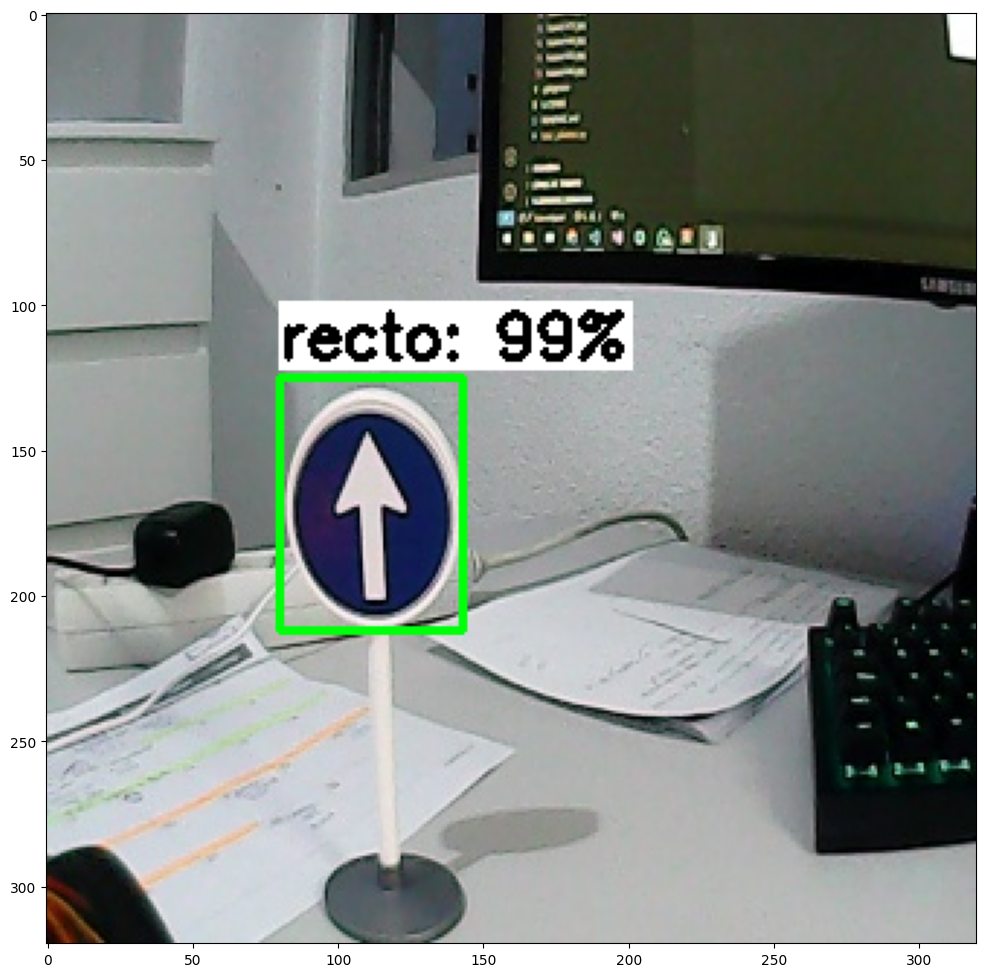

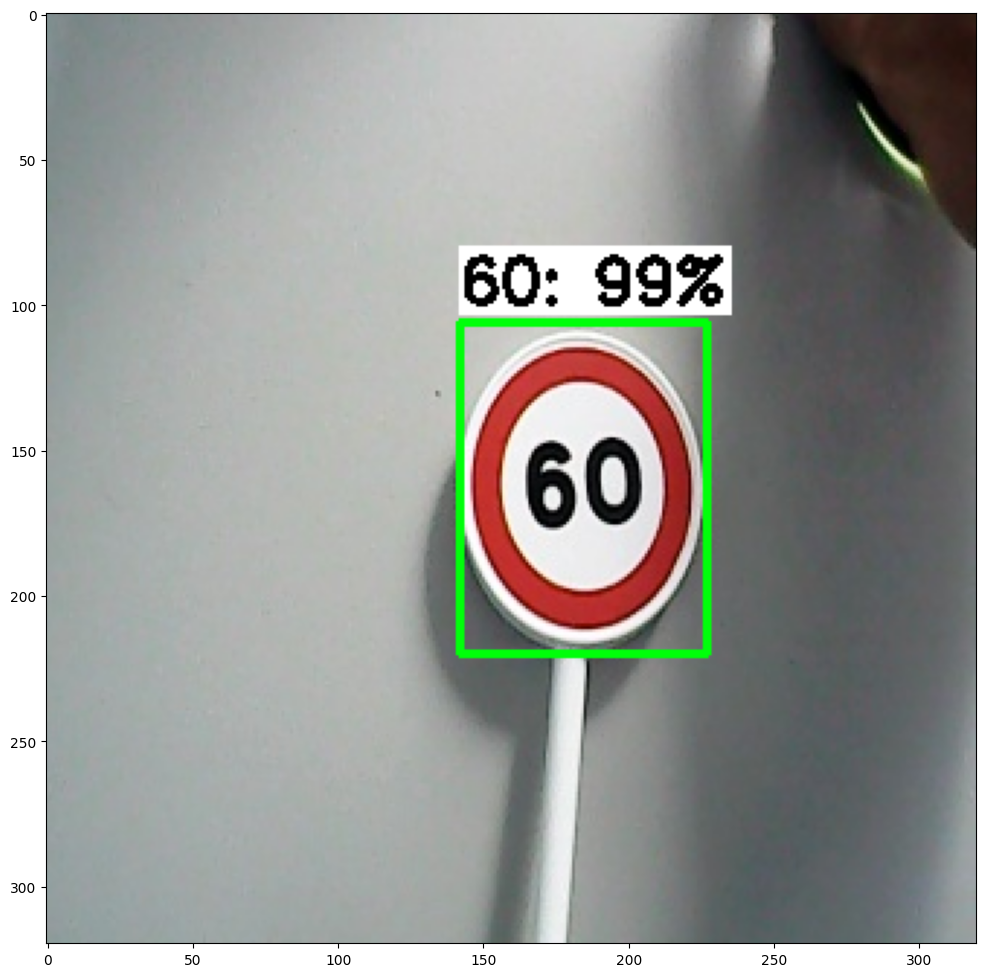

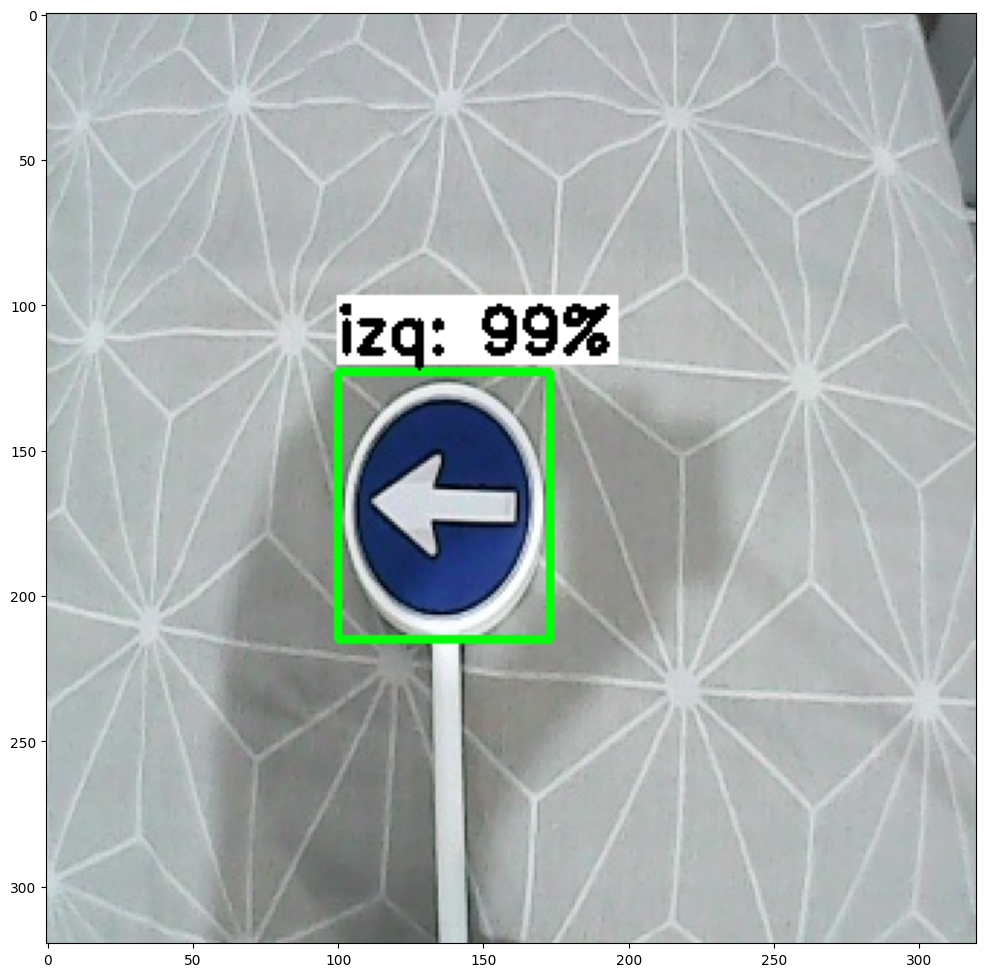

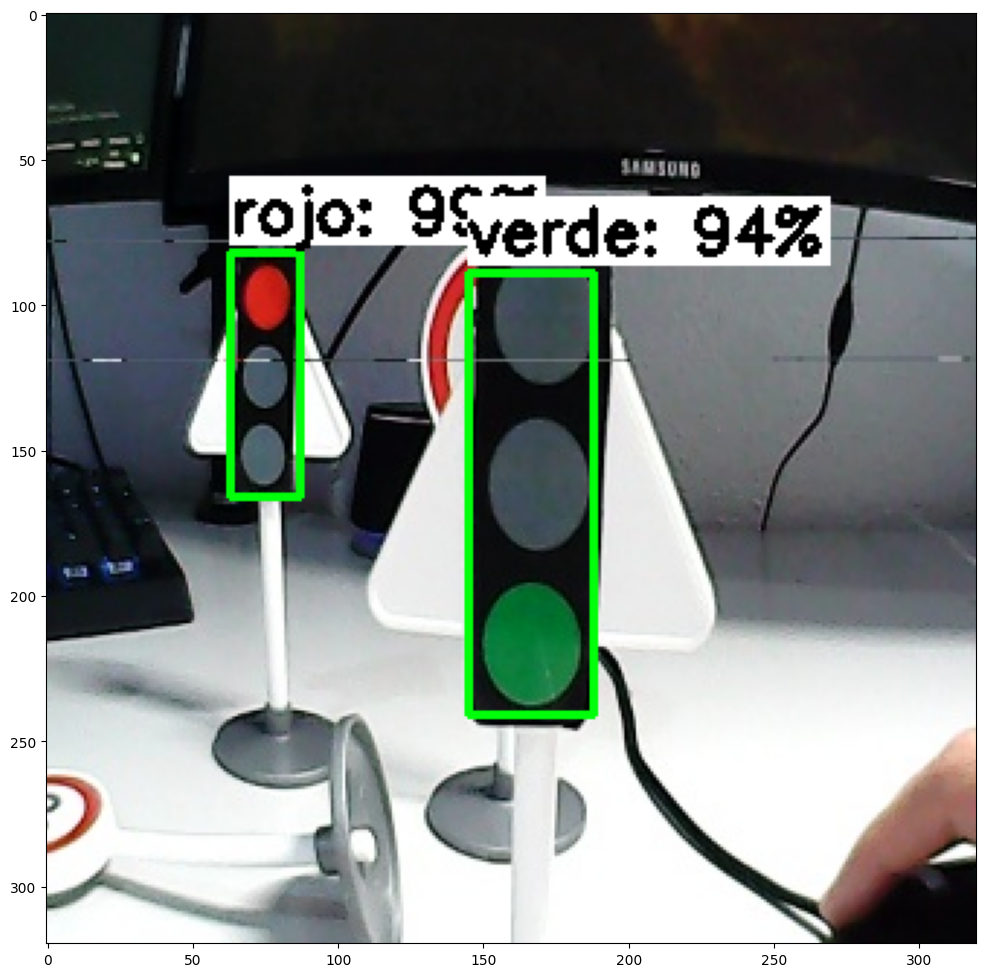

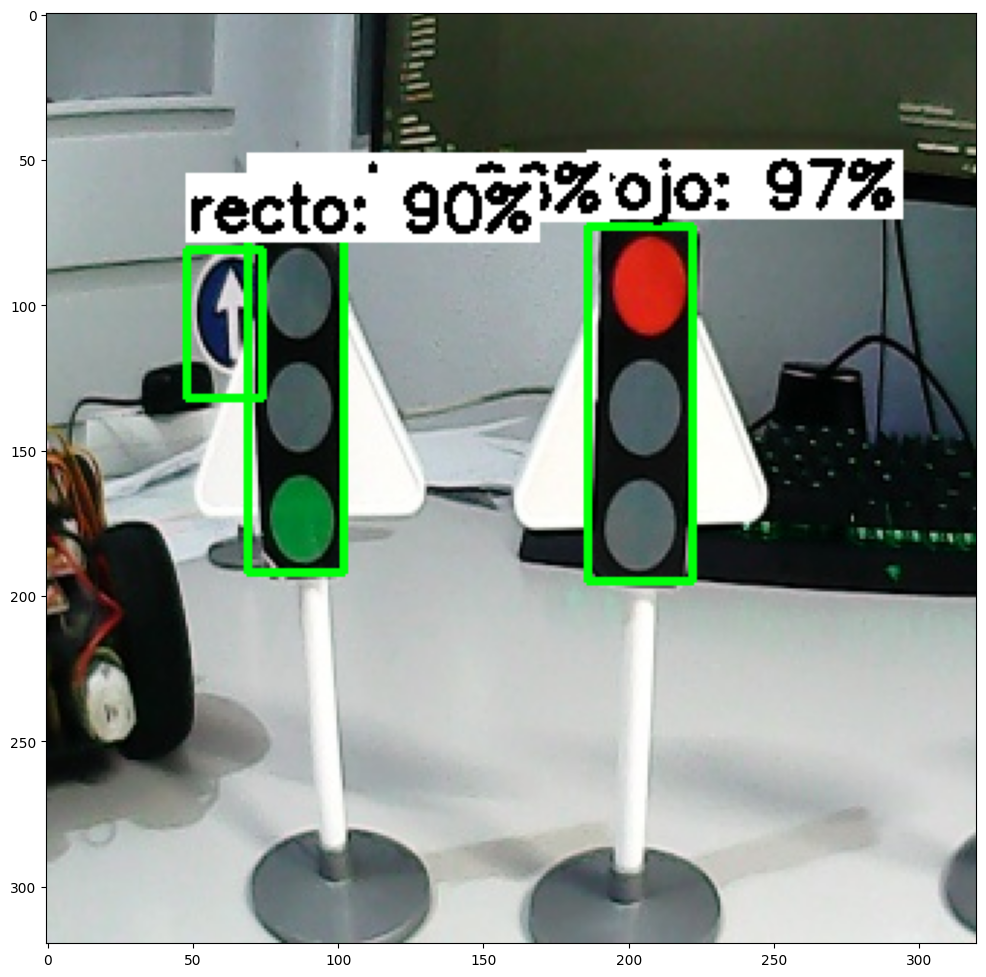

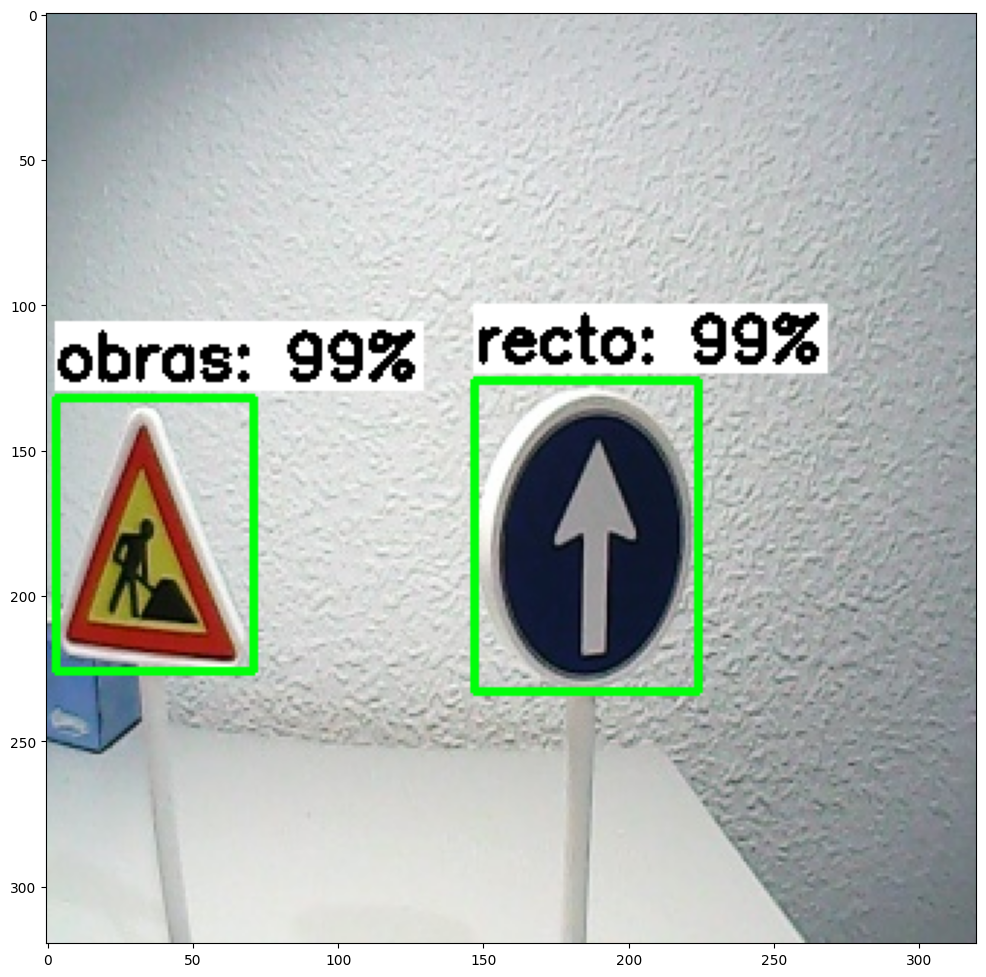

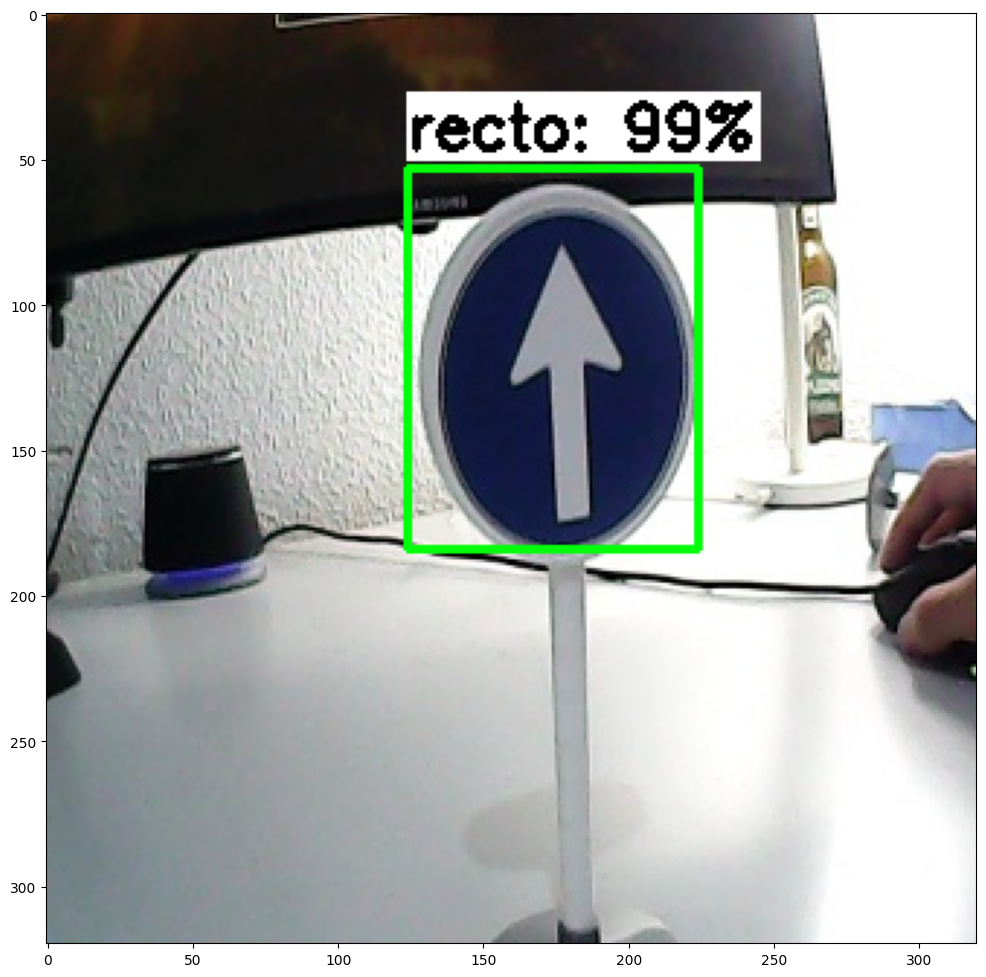

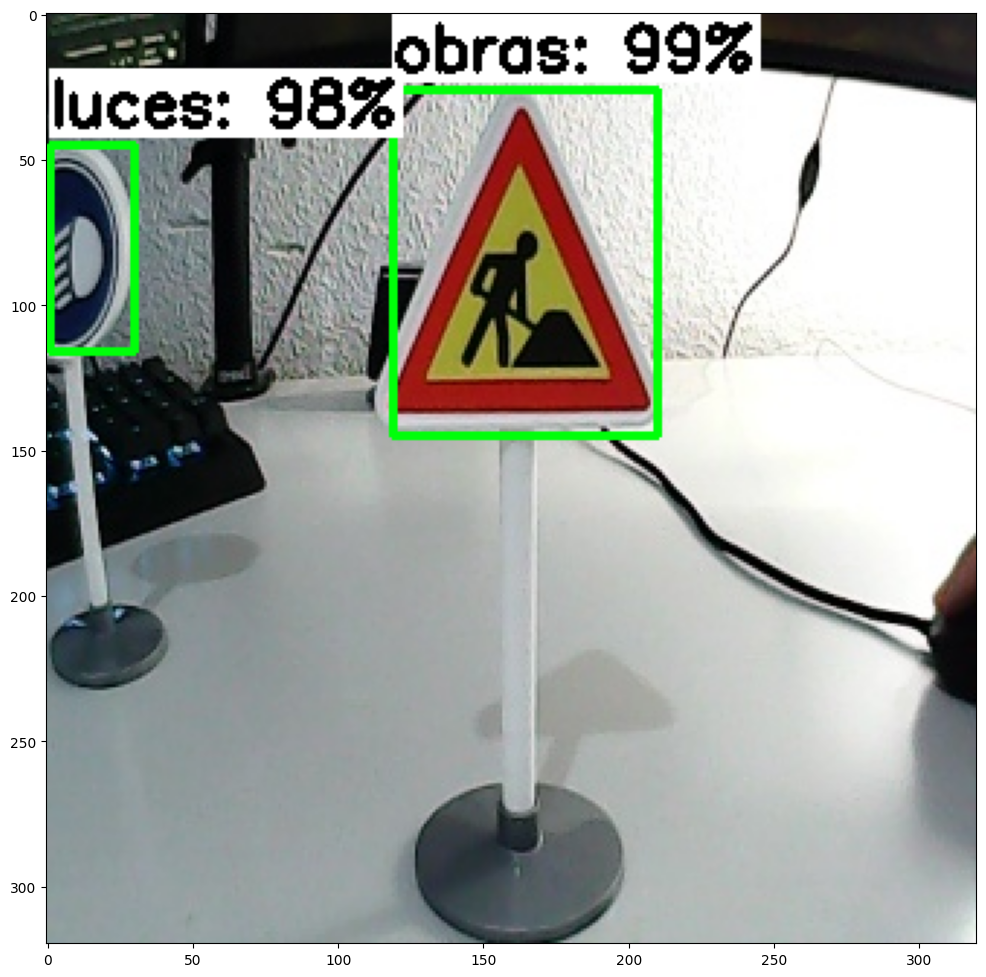

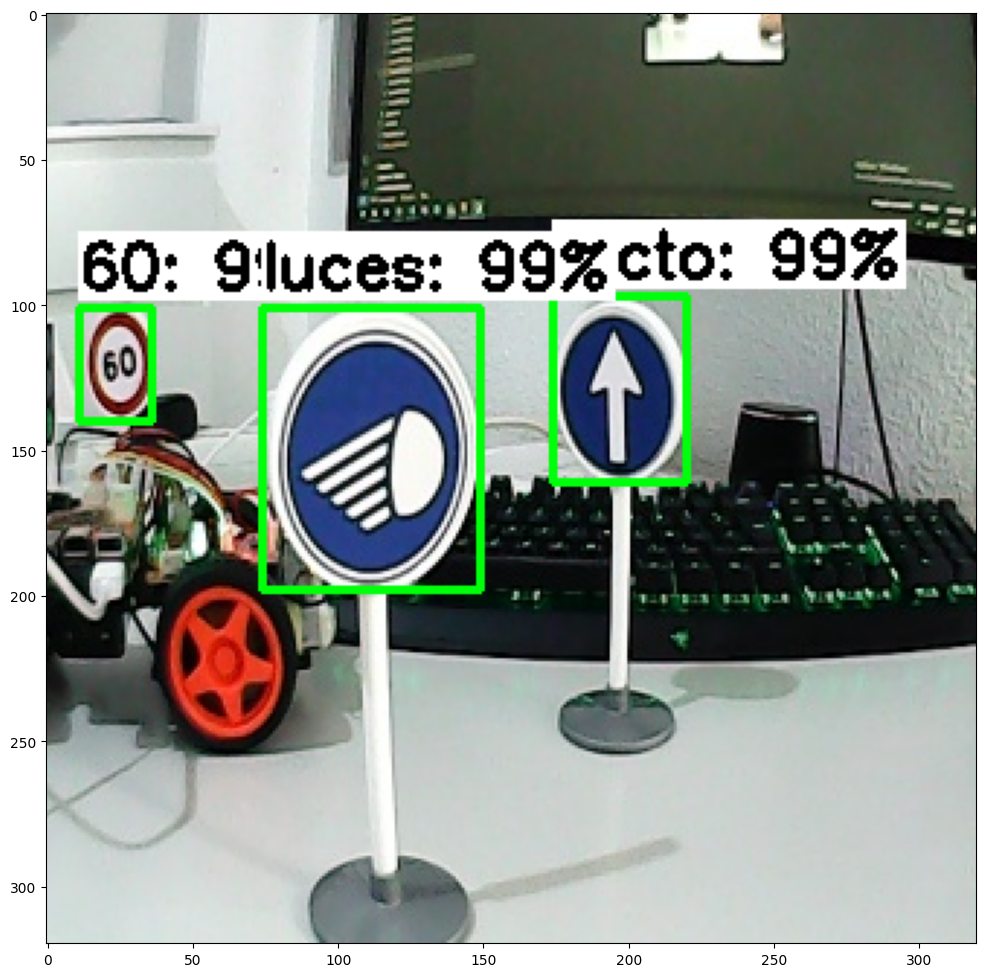

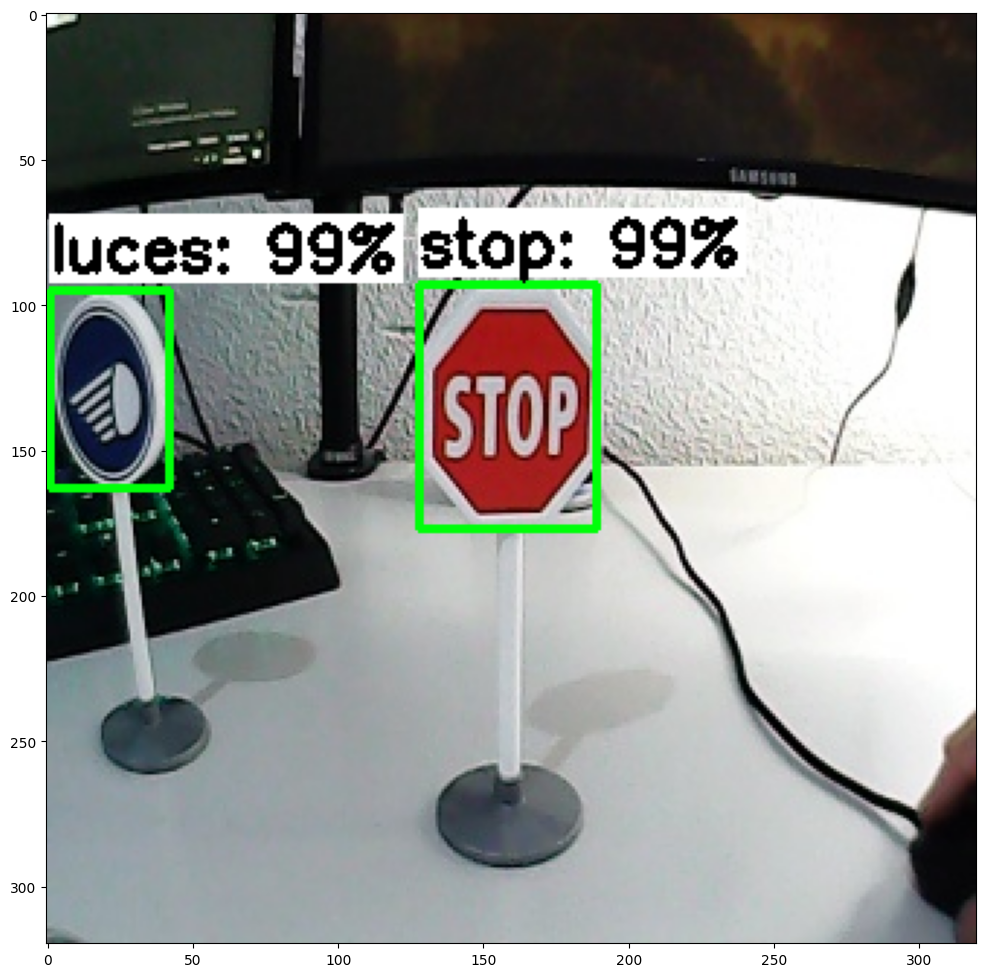

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/dataset/test'   # Path to test images folder
PATH_TO_MODEL='/content/traffic_signs_detection_model/detect_quant.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)